In [1]:
import pandas as pd
import random
import keras
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import glob as gb
import cv2
import tensorflow as tf
from tensorflow.keras import backend
from tensorflow.keras.models import Sequential
import tensorflow.keras
#import keras
from tensorflow import keras

# data path

In [2]:
path = 'E://aaaa_photos_paths//drive_photosssss//mixed_new//'

# number of the data for train ,test and prediction

In [3]:
for folder in  os.listdir(path+'try'):
    files=gb.glob(pathname=str(path+'try//'+folder+'/*.jpg'))
    print(f'For training data , found{len(files)} in folder {folder}')
  

For training data , found8500 in folder babars
For training data , found8500 in folder bassem
For training data , found8500 in folder elelfy
For training data , found8500 in folder eman
For training data , found8500 in folder nabiel
For training data , found8500 in folder nour
For training data , found8500 in folder ramadn
For training data , found8500 in folder roqia
For training data , found8500 in folder sabek


In [4]:
for folder in  os.listdir(path+'test'):
    files=gb.glob(pathname=str(path+'test//'+folder+'/*.jpg'))
    print(f'For testing data , found{len(files)} in folder {folder}')

For testing data , found1700 in folder babars
For testing data , found1700 in folder bassem
For testing data , found1700 in folder elelfy
For testing data , found1700 in folder eman
For testing data , found1700 in folder nabiel
For testing data , found1700 in folder nour
For testing data , found1700 in folder ramadn
For testing data , found1700 in folder roqia
For testing data , found1700 in folder sabek


In [5]:
files=gb.glob(pathname=str(path+'per//'+'/*jpg'))
print(f'For prediction data , found {len(files)} ')

For prediction data , found 61 


# check the size of the images of train test and prediction

In [6]:
#size of the train images
size=[]
for folder in  os.listdir(path+'try'):
    files=gb.glob(pathname=str(path+'try//'+folder+'/*.jpg'))
    for file in files:
        image=plt.imread(file)
        if image.shape[0]<140 and image.shape[1]<140:
               os.remove(file)  
        else:
        
               size.append(image.shape)
        
pd.Series(size).value_counts()

(252, 252, 3)    41451
(140, 140, 3)    18877
(282, 282, 3)     7199
(272, 272, 3)     4336
(160, 160, 3)     1717
                 ...  
(271, 302, 3)        1
(281, 292, 3)        1
(261, 302, 3)        1
(260, 302, 3)        1
(268, 302, 3)        1
Length: 69, dtype: int64

In [7]:
# size of the test images
size=[]
for folder in  os.listdir(path+'test'):
    files=gb.glob(pathname=str(path+'test//'+folder+'/*.jpg'))
    for file in files:
        image=plt.imread(file)
       
        size.append(image.shape)
        
       
pd.Series(size).value_counts()

(252, 252, 3)    6127
(140, 140, 3)    4342
(282, 282, 3)    1539
(272, 272, 3)     971
(292, 292, 3)     650
                 ... 
(301, 302, 3)       1
(288, 302, 3)       1
(257, 292, 3)       1
(300, 302, 3)       1
(283, 292, 3)       1
Length: 61, dtype: int64

In [8]:
size = []
files = gb.glob(pathname= str(path +'per/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(252, 252, 3)    49
(140, 140, 3)    12
dtype: int64

# Reading Images

In [9]:
size=140

In [10]:
code = {'babars':0,'bassem':1,'elelfy':2,'eman':3,'nabiel':4,'nour':5,'ramadn':6,'roqia':7,'sabek':8}
def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x 

In [11]:
#read train data map indexes and names
X_train=[]
y_train=[]

           
        
for folder in  os.listdir(path+'try'):
    files=gb.glob(pathname=str(path+'try//'+folder+'/*.jpg'))
    for file in files:
          
                image=cv2.imread(file)
            
                image_array=cv2.resize(image,(size,size))#return image as np array with the new size
                X_train.append(list(image_array))
                y_train.append(code[folder])
            

#  randomize the training data

In [12]:
random.seed(0)
random.shuffle(X_train)
random.seed(0)
random.shuffle(y_train)

In [13]:
print(f'we have {len(X_train)} items in X_train')
print(type(X_train[0]))
#print(X_train[0])

we have 76500 items in X_train
<class 'list'>


look to random pictures in X_train ,
and to adjust their title using the y value

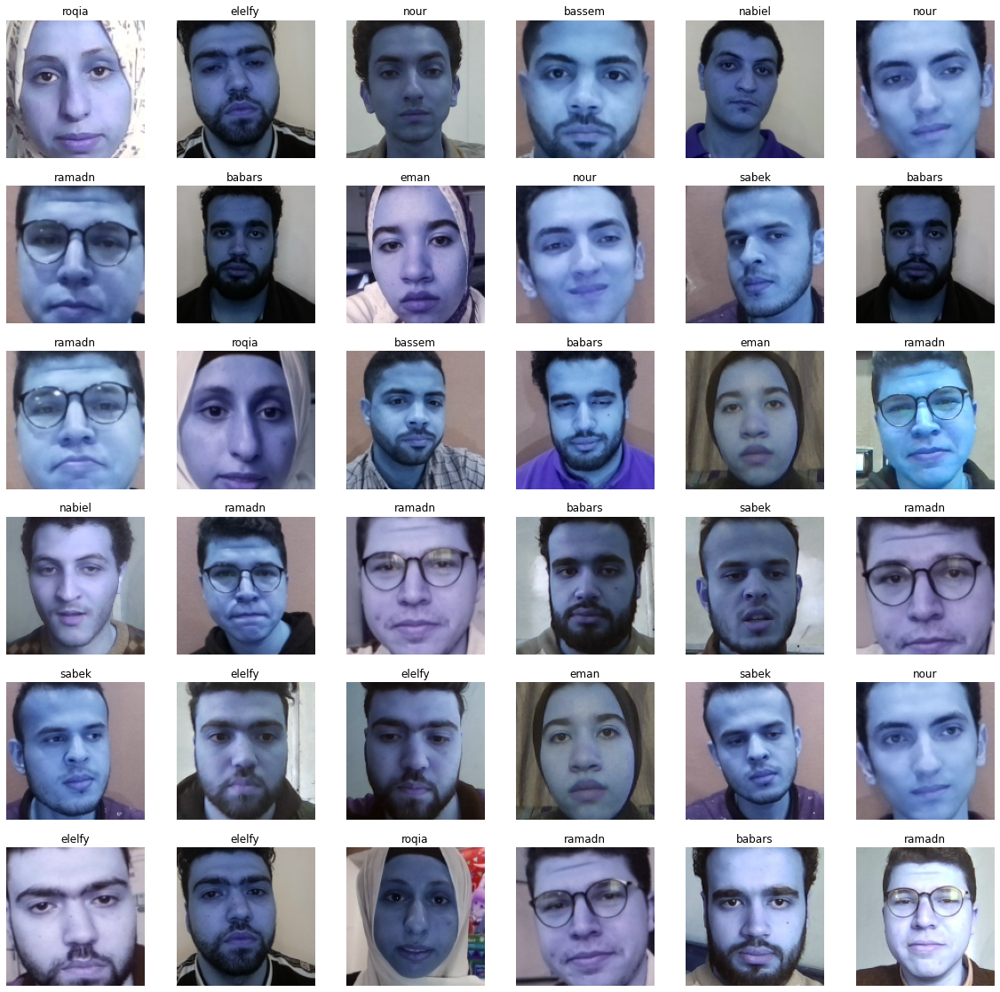

In [14]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [15]:
#read the test data map indexes and names
X_test = []
y_test = []
y_confution_true=y_test



for folder in  os.listdir(path +'test') : 
    files = gb.glob(pathname= str(path + 'test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        
        image_array = cv2.resize(image , (size,size))
        
        X_test.append(list(image_array))
        y_test.append(code[folder])
                
       

In [16]:
print(f'we have {len(X_test)} items in X_test')
#print(X_test[0])

we have 15300 items in X_test


look to random pictures in X_test ,
and to adjust their title using the y value

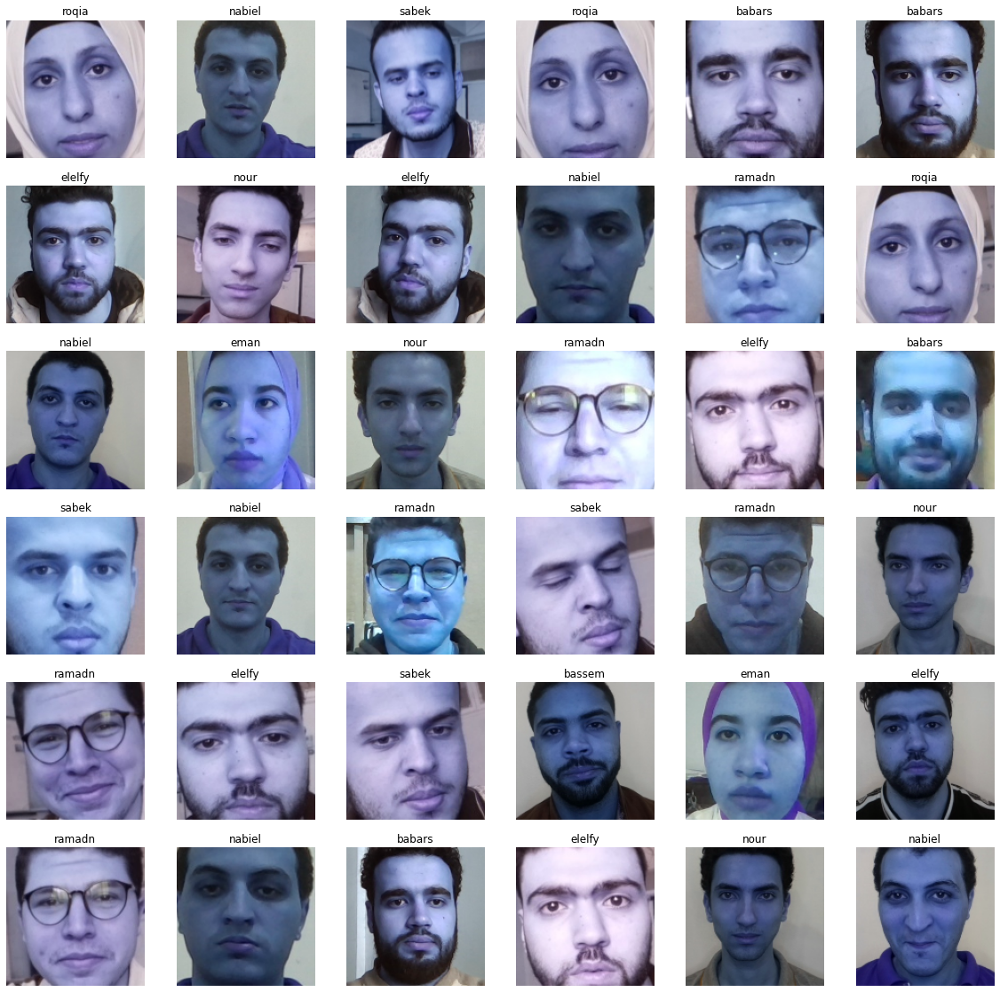

In [18]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [19]:
#read the prediction data 
X_pred = []
files = gb.glob(pathname= str(path + 'per/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image ,(size,size))
    
    X_pred.append(list(image_array))  

In [20]:
print(f'we have {len(X_pred)} items in X_pred')

we have 61 items in X_pred


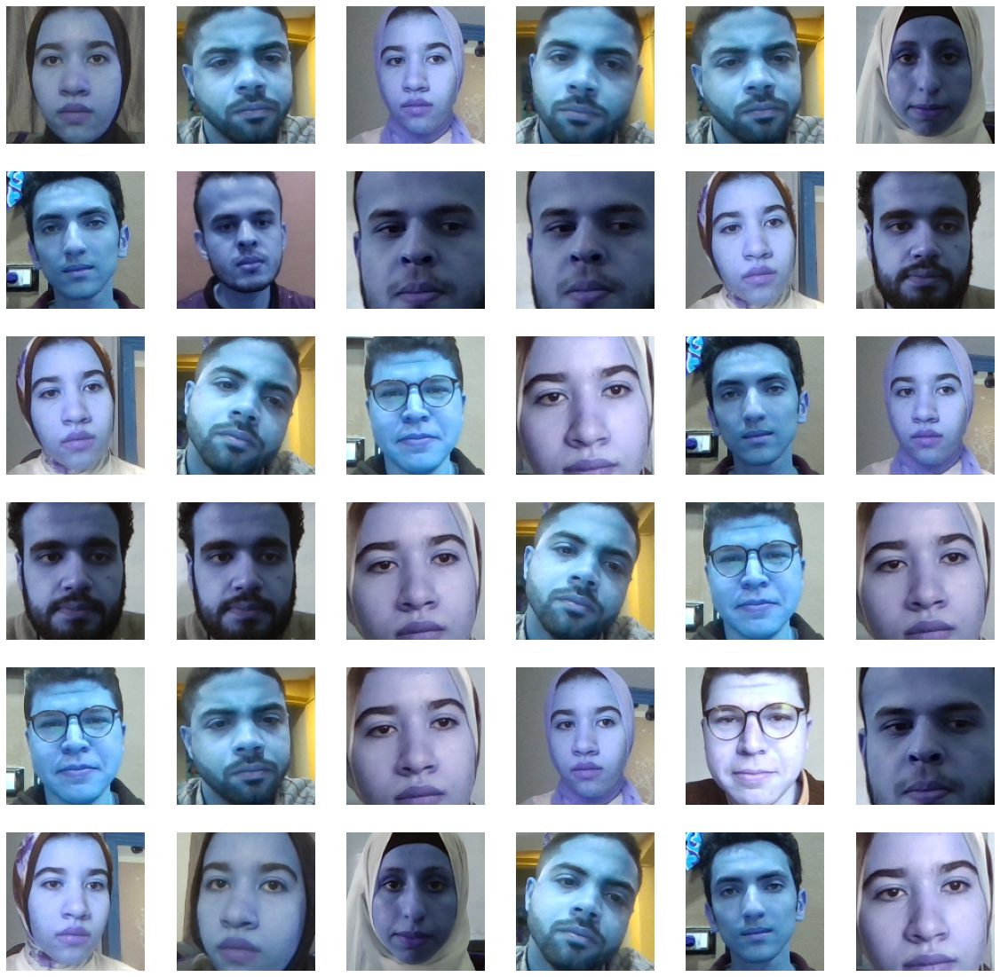

In [21]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')

# convert the data into arrays using numpy because tensorflow take array of four dim

In [22]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')


X_train shape  is (76500, 140, 140, 3)
X_test shape  is (15300, 140, 140, 3)
X_pred shape  is (61, 140, 140, 3)
y_train shape  is (76500,)
y_test shape  is (15300,)


# Building The Model

# Define the model

In [30]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(128,kernel_size=(3,3),activation='relu',input_shape=(size,size,3), padding='same'),
        keras.layers.MaxPool2D(2,2),
        
        keras.layers.Conv2D(128,kernel_size=(3,3),activation='relu'),  
        keras.layers.Dropout(rate=0.05) ,
        
        keras.layers.Conv2D(64,kernel_size=(5,5),activation='relu'), 
        keras.layers.MaxPool2D(2,2),
        
        keras.layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
        
        keras.layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
       
        keras.layers.Conv2D(32,kernel_size=(3,3),activation='relu', padding='same'),
        keras.layers.MaxPool2D(2,2),
        keras.layers.Conv2D(32,kernel_size=(3,3),activation='relu'),
        
        keras.layers.Flatten() ,    
        keras.layers.Dense(64,activation='relu') , 
        keras.layers.Dropout(rate=0.2) , 
        keras.layers.Dense(32,activation='relu') ,    
        keras.layers.Dense(64,activation='relu') , 
        keras.layers.Dense(32,activation='relu') , 
        keras.layers.Dropout(rate=0.1) ,
        keras.layers.Dense(32,activation='relu') ,
        keras.layers.Dense(9,activation='softmax') ,    
        ])

# set the optimizer

In [31]:
optimizer =tf.keras.optimizers.Adam(
     learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False,
     name='Adam') 

In [32]:
KerasModel.compile(optimizer =optimizer,loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [33]:
print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 140, 140, 128)     3584      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 70, 70, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 68, 68, 128)       147584    
_________________________________________________________________
dropout_3 (Dropout)          (None, 68, 68, 128)       0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 64, 64, 64)        204864    
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (Non

In [34]:
epochs=25
model = KerasModel.fit(X_train, y_train, epochs=epochs,validation_data=(X_test, y_test),verbose=1)

Train on 76500 samples, validate on 15300 samples
Epoch 1/25
76500/76500 [==============================] - 12999s 170ms/sample - loss: 0.5561 - accuracy: 0.8108 - val_loss: 0.4183 - val_accuracy: 0.8734
Epoch 2/25
76500/76500 [==============================] - 12638s 165ms/sample - loss: 0.1007 - accuracy: 0.9707 - val_loss: 0.3306 - val_accuracy: 0.9056
Epoch 3/25
76500/76500 [==============================] - 12575s 164ms/sample - loss: 0.0589 - accuracy: 0.9830 - val_loss: 0.3164 - val_accuracy: 0.9024
Epoch 4/25
76500/76500 [==============================] - 12294s 161ms/sample - loss: 0.0522 - accuracy: 0.9861 - val_loss: 0.5917 - val_accuracy: 0.8835
Epoch 5/25
76500/76500 [==============================] - 12306s 161ms/sample - loss: 0.0345 - accuracy: 0.9904 - val_loss: 0.3135 - val_accuracy: 0.9100
Epoch 6/25
76500/76500 [==============================] - 12555s 164ms/sample - loss: 0.0299 - accuracy: 0.9921 - val_loss: 0.2083 - val_accuracy: 0.9500
Epoch 7/25
76500/76500 [==

In [35]:
KerasModel.save('cal_nine1.h5')
KerasModel.save('cal_nine1.model')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: cal_nine1.model\assets


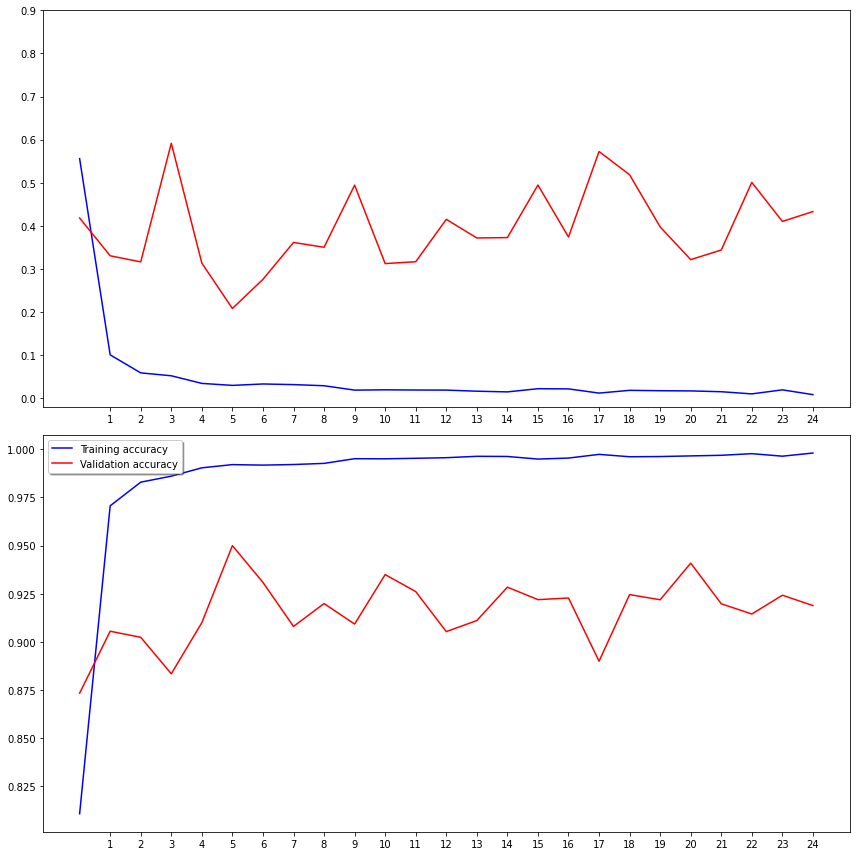

In [36]:

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(model.history['loss'], color='b', label="Training loss")
ax1.plot(model.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, epochs, 1))
ax1.set_yticks(np.arange(0, 1, 0.1))

ax2.plot(model.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(model.history['val_accuracy'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, epochs, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()


# val_accuarcy


In [37]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

15300/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Test Loss is 0.4331815068507324
Test Accuracy is 0.9188888669013977


# predict x_test

In [38]:
y_pred = KerasModel.predict(tf.cast(X_test,tf.float32))

#y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))
print(type(y_pred))
print(type(y_test))

Prediction Shape is (15300, 9)
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


# predict x_pred

In [39]:
y_result = KerasModel.predict(tf.cast(X_pred_array,tf.float32))

print('Prediction Shape is {}'.format(y_result.shape))

Prediction Shape is (61, 9)



# confusion_matrix

In [40]:
print(y_pred)
y_pred_list=[]
for i in range(len(y_pred)):
    
    y_pred_list.append(np.argmax(y_pred[i]))
    
    
print(y_pred_list) 

[[1.00000000e+00 2.22695573e-09 1.13039196e-11 ... 2.16648412e-15
  7.20410365e-31 6.09970341e-09]
 [1.00000000e+00 1.74828346e-10 5.75302826e-13 ... 4.44302662e-17
  1.96355541e-34 6.10991202e-10]
 [1.00000000e+00 1.05649926e-10 2.37503051e-13 ... 1.87832699e-17
  3.30053789e-35 4.21613855e-10]
 ...
 [5.29154961e-04 1.85422381e-04 7.61838513e-04 ... 6.40947418e-03
  3.02218646e-03 9.74449635e-01]
 [1.75514706e-05 1.97337317e-06 2.31948034e-05 ... 8.23919545e-04
  8.63324749e-05 9.98243809e-01]
 [1.46664359e-04 3.01529362e-05 1.89592625e-04 ... 3.02040810e-03
  6.09303301e-04 9.91499126e-01]]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [41]:
from sklearn.metrics import confusion_matrix

y_pred_list=[]
for i in range(len(y_pred)):
    y_pred_list.append(np.argmax(y_pred[i]))
    

confusion_matrix(y_confution_true, y_pred_list)

array([[1535,   12,  147,    1,    0,    3,    0,    0,    2],
       [  75, 1617,    3,    0,    0,    0,    0,    0,    5],
       [   4,   34, 1656,    2,    0,    0,    4,    0,    0],
       [   0,   10,  126, 1304,   32,    0,    0,   92,  136],
       [   0,    0,    0,    0, 1700,    0,    0,    0,    0],
       [  94,    4,    0,   28,   32, 1484,    1,    8,   49],
       [   0,    0,    0,    0,   21,   12, 1662,    4,    1],
       [   0,    0,    0,    0,   14,    0,    0, 1686,    0],
       [   8,   38,   54,   69,   70,   21,    9,   16, 1415]],
      dtype=int64)

# predection result 

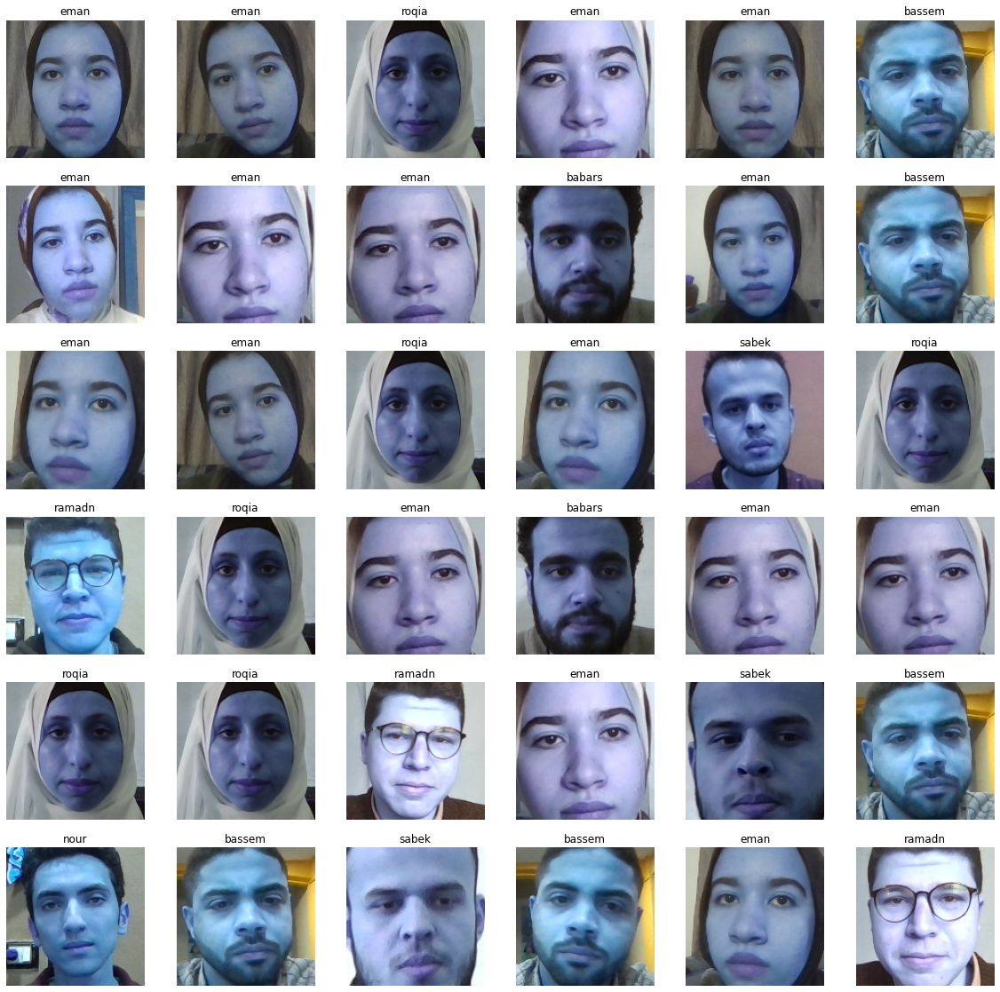

In [43]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

# predection in test data

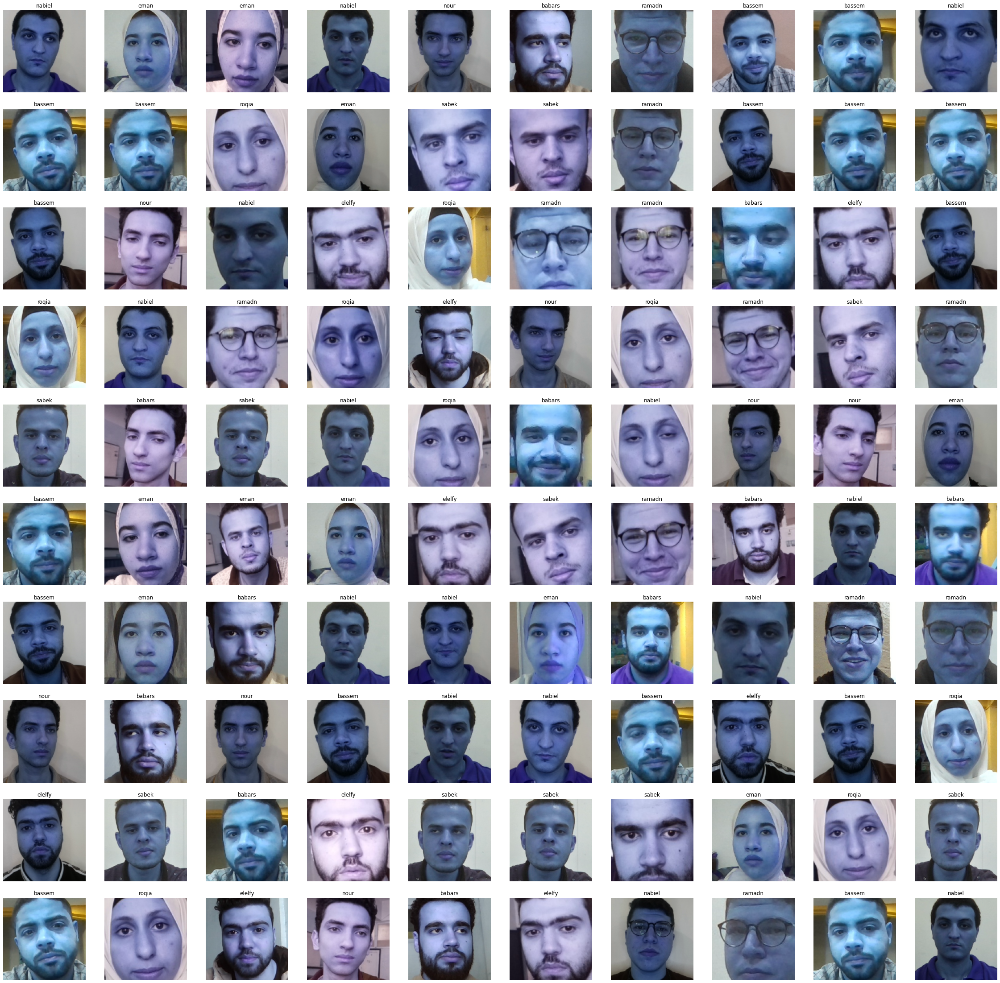

In [49]:
plt.figure(figsize=(40,40))
for n , i in enumerate(list(np.random.randint(0,len(X_test),100))) : 
    plt.subplot(10,10,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_pred[i])))
    #print(y_test[i])

In [46]:
KerasModel.save('cal_nine2.h5')

In [47]:
KerasModel.save('cal_nine2.model')

INFO:tensorflow:Assets written to: cal_nine2.model\assets
